In [45]:
import pandas as pd
import re
import string
import seaborn as sns
import spacy
import numpy as np
from numpy import reshape
from num2words import num2words
from bs4 import BeautifulSoup
from pprint import pprint
from spellchecker import SpellChecker

# NLTK
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem import PorterStemmer
import nltk
nltk.download('punkt')
nltk.download('stopwords')
stop_words = stopwords.words('english')

# Lime
import lime
from lime import lime_text
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.models import Word2Vec, FastText
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from wordcloud import WordCloud
from mlxtend.plotting import plot_confusion_matrix
%matplotlib inline

# Sklearn
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Tensorflow

import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, GlobalMaxPooling1D, Dense, Dropout

# BERT
from bertopic import BERTopic

# Transformers
from transformers import MarianMTModel, MarianTokenizer
from transformers import T5Tokenizer, T5ForConditionalGeneration
from transformers import BertTokenizer, TFBertForSequenceClassification

from googletrans import Translator
import time

import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)
import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Loading Dataset and EDA 

In [46]:
df = pd.read_csv(r'C:\Users\user\Downloads\Reviews.csv')
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [47]:
df.drop(['Id', 'ProductId', 'UserId'], axis=1, inplace=True)
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


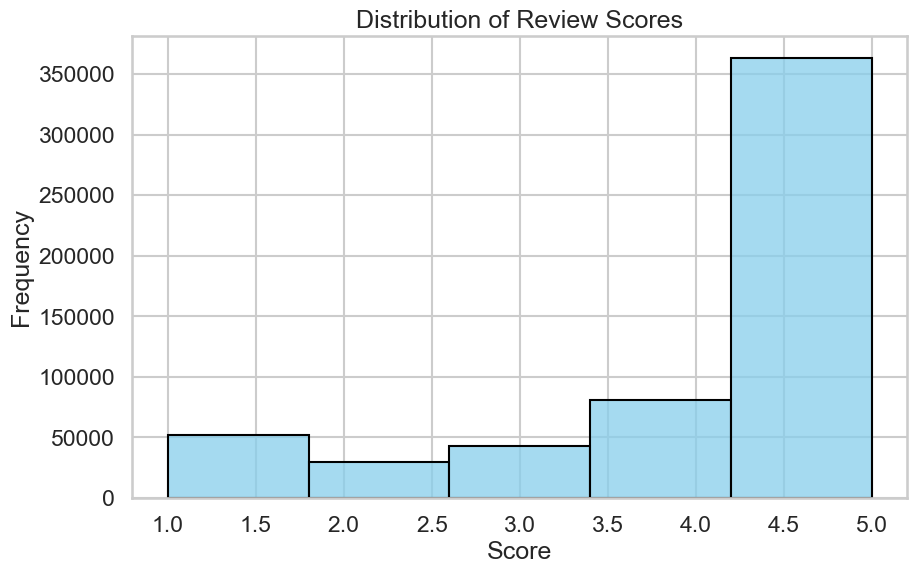

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.histplot(df['Score'], bins=5, color='skyblue', edgecolor='black')
plt.title('Distribution of Review Scores')
plt.xlabel('Score')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

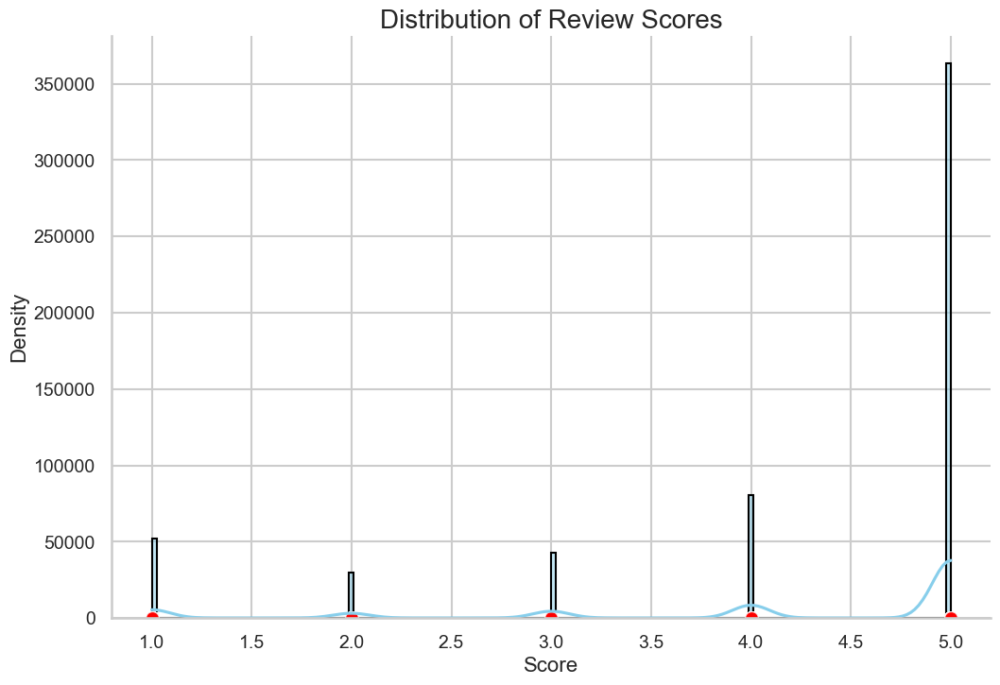

In [49]:
plt.figure(figsize=(12, 8))
sns.histplot(df['Score'], kde=True, color='skyblue', edgecolor='black', linewidth=1.5)
sns.scatterplot(data=df, x='Score', y=[0]*len(df), color='red', marker='o', s=100, alpha=0.7)
plt.title('Distribution of Review Scores', fontsize=20)
plt.xlabel('Score', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(True)

sns.despine()

plt.show()

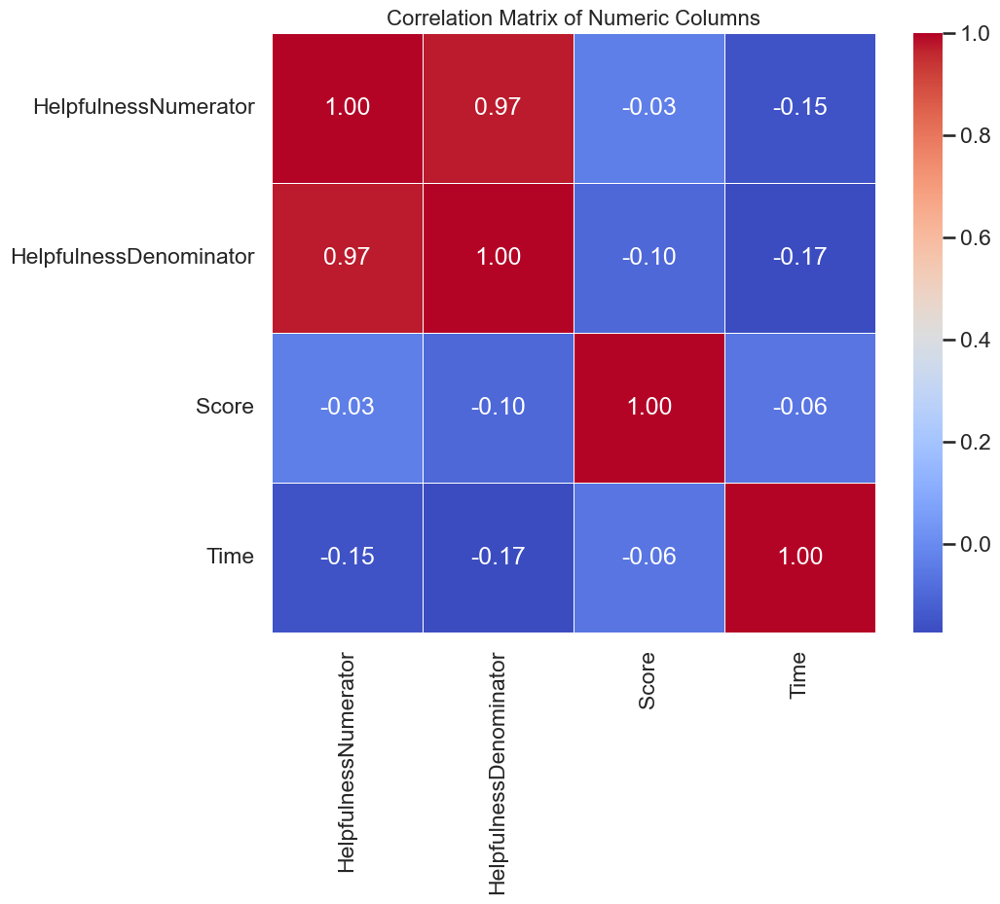

In [50]:
numeric_df = df.select_dtypes(include=['int64', 'float64'])


correlation_matrix = numeric_df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Numeric Columns', fontsize=16)
plt.show()

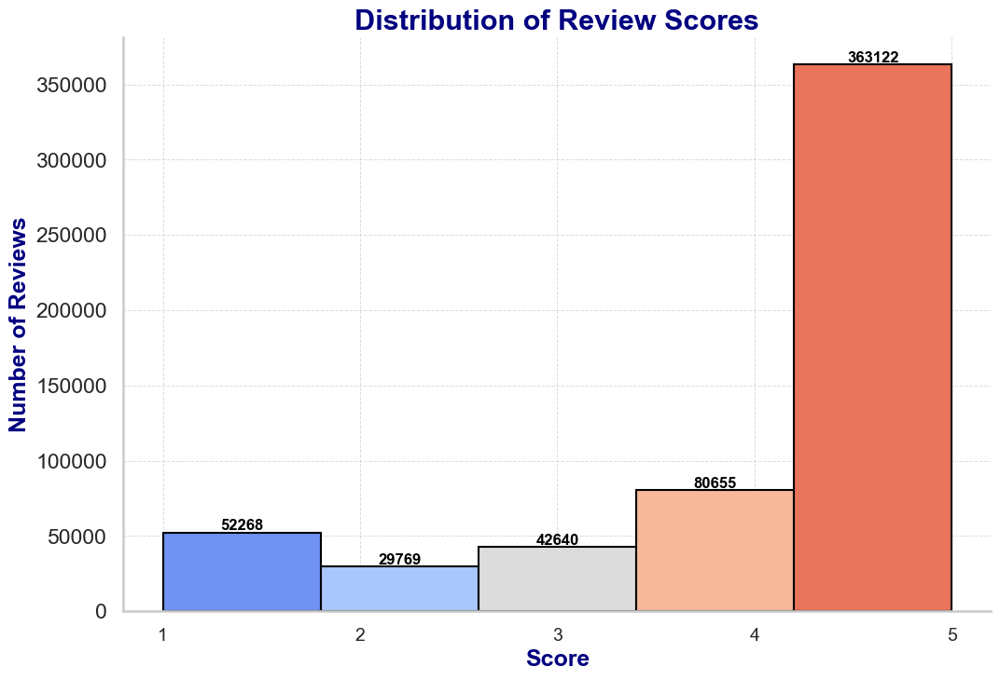

In [51]:
sns.set(style="whitegrid", context="talk")

colors = sns.color_palette("coolwarm", 5)

score_counts = df['Score'].value_counts().sort_index()

plt.figure(figsize=(12, 8))

bars = sns.histplot(df['Score'], bins=5, palette=colors, edgecolor='black', kde=False)

for bar, count in zip(bars.patches, score_counts):
    plt.annotate(f'{count}', 
                 xy=(bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                 xytext=(0, 5), 
                 textcoords='offset points', 
                 ha='center', 
                 va='center', 
                 fontsize=12, 
                 fontweight='bold', 
                 color='black')

for i, patch in enumerate(bars.patches):
    plt.setp(patch, 'facecolor', colors[i % len(colors)])

plt.title('Distribution of Review Scores', fontsize=22, fontweight='bold', color='navy')
plt.xlabel('Score', fontsize=18, fontweight='bold', color='navy')
plt.ylabel('Number of Reviews', fontsize=18, fontweight='bold', color='navy')

plt.xticks(np.arange(1, 6, 1), fontsize=14)

plt.grid(True, linestyle='--', linewidth=0.7, alpha=0.7)

sns.despine()

plt.show()

In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568454 entries, 0 to 568453
Data columns (total 7 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   ProfileName             568428 non-null  object
 1   HelpfulnessNumerator    568454 non-null  int64 
 2   HelpfulnessDenominator  568454 non-null  int64 
 3   Score                   568454 non-null  int64 
 4   Time                    568454 non-null  int64 
 5   Summary                 568427 non-null  object
 6   Text                    568454 non-null  object
dtypes: int64(4), object(3)
memory usage: 30.4+ MB


In [53]:
df.dropna()
#The N/As are much less than 1% and are in the profile name which makes no sende to impute, so we just drop this few (26) reviews
#Even keeping them would not give so much value to our models

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...
...,...,...,...,...,...,...,...
568449,Lettie D. Carter,0,0,5,1299628800,Will not do without,Great for sesame chicken..this is a good if no...
568450,R. Sawyer,0,0,2,1331251200,disappointed,I'm disappointed with the flavor. The chocolat...
568451,"pksd ""pk_007""",2,2,5,1329782400,Perfect for our maltipoo,"These stars are small, so you can give 10-15 o..."
568452,"Kathy A. Welch ""katwel""",1,1,5,1331596800,Favorite Training and reward treat,These are the BEST treats for training and rew...


### Pre-Processing

In [54]:
df = df.iloc[:7000]
#Takes a lot of time, so we just keep a sample of our data

In [55]:
df['raw_text'] = df['Text']

In [56]:
df['Text'] = df['Text'].str.lower()
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,I have bought several of the Vitality canned d...
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,This is a confection that has been around a fe...
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price. there was a wid...,Great taffy at a great price. There was a wid...


In [57]:
def remove_html_tags(text):
    soup = BeautifulSoup(text, "html.parser")
    soup = soup.get_text()
    return soup

In [58]:
df['Text'] = df['Text'].apply(remove_html_tags)
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,I have bought several of the Vitality canned d...
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,This is a confection that has been around a fe...
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price. there was a wid...,Great taffy at a great price. There was a wid...


In [59]:
def remove_urls(text):
    url_pattern = re.compile(r'https?://\S+|www\.\S+')
    return url_pattern.sub('', text)

In [60]:
df['Text'] = df['Text'].apply(remove_urls)
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,I have bought several of the Vitality canned d...
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,This is a confection that has been around a fe...
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price. there was a wid...,Great taffy at a great price. There was a wid...


In [61]:
def remove_irrelevant_chars(text):
    cleaned_text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    return cleaned_text

In [62]:
df['Text'] = df['Text'].apply(remove_irrelevant_chars)
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,I have bought several of the Vitality canned d...
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,This is a confection that has been around a fe...
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price there was a wide...,Great taffy at a great price. There was a wid...


In [63]:
def remove_punctuation(text):
    cleaned_text = text.translate(str.maketrans("", "", string.punctuation))
    return cleaned_text

In [64]:
df['Text'] = df['Text'].apply(remove_punctuation)
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,I have bought several of the Vitality canned d...
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,This is a confection that has been around a fe...
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price there was a wide...,Great taffy at a great price. There was a wid...


In [65]:
def remove_duplicate_text(df):
    df = df.drop_duplicates()
    return df

In [66]:
print(df.shape)
df = remove_duplicate_text(df)
print(df.shape)

(7000, 8)
(6988, 8)


In [67]:
def split_number_word_in_sentence(text):
    if not isinstance(text, str):
        text = str(text)
    
    pattern = r'(\d+)([a-zA-Z]+)'
    
    def replace_match(match):
        return f'{match.group(1)} {match.group(2)}'
    
    result = re.sub(pattern, replace_match, text)
    return result
#We noticed case of stucked numbers with words (e.g 12coins), so we split them to be able later to replace numbers with words
#and not keep this stucked words as different rare words.

In [68]:
df['Text'] = df['Text'].apply(split_number_word_in_sentence)
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,I have bought several of the Vitality canned d...
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,This is a confection that has been around a fe...
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price there was a wide...,Great taffy at a great price. There was a wid...


In [69]:
def replace_numbers_with_words(text):
    words = []
    for word in text.split():
        if word.isdigit():
            words.append(num2words(int(word)))
        else:
            words.append(word)
    return ' '.join(words)

In [70]:
df['Text'] = df['Text'].apply(replace_numbers_with_words)
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,I have bought several of the Vitality canned d...
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,This is a confection that has been around a fe...
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price there was a wide ...,Great taffy at a great price. There was a wid...


In [71]:
def remove_invalid_words(sentence):
    words = sentence.split()
    valid_words = [word for word in words if not re.search(r'(.)\1\1', word)]
    return ' '.join(valid_words)
#We notice consecutive sepate characters(e.g aaaa) which are not useful and cannot be corrected by the spellchecker either, so we droped them

In [72]:
df['Text'] = df['Text'].apply(remove_invalid_words)
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,I have bought several of the Vitality canned d...
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,This is a confection that has been around a fe...
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price there was a wide ...,Great taffy at a great price. There was a wid...


In [73]:
df["Text"] = df["Text"].str.strip()

df["Text"] = df["Text"].str.replace(r'\s+', ' ', regex=True)

df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,I have bought several of the Vitality canned d...
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,This is a confection that has been around a fe...
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price there was a wide ...,Great taffy at a great price. There was a wid...


In [74]:
def remove_single_characters(sentence):
    words = sentence.split()
    valid_words = [word for word in words if len(word) > 1]
    return ' '.join(valid_words)

In [75]:
df['Text'] = df['Text'].apply(remove_single_characters)
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,have bought several of the vitality canned dog...,I have bought several of the Vitality canned d...
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is confection that has been around few ce...,This is a confection that has been around a fe...
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at great price there was wide asso...,Great taffy at a great price. There was a wid...


In [76]:
spell = SpellChecker()

In [77]:
def correct_spelling(text):
    corrected_words = []
    for word in text.split():
        corrected_word = spell.correction(word)
        if corrected_word is not None:
            corrected_words.append(corrected_word)
    return ' '.join(corrected_words)

In [78]:
df['Corrected_text'] = df['Text'].apply(correct_spelling)
df.head()

In [79]:
stopwords_list = set(stopwords.words("english"))

In [81]:
df["Corrected_text_without_stopwords"] = df['Corrected_text'].apply(lambda x: ' '.join([word for word in word_tokenize(x) if word.lower() not in stopwords_list]))
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text,Corrected_text_without_stopwords
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,have bought several of the vitality canned dog...,I have bought several of the Vitality canned d...,bought several vitality canned dog food produc...
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...,product arrived labeled jumbo salted peanutsth...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is confection that has been around few ce...,This is a confection that has been around a fe...,confection around centuries light pillowy citr...
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...,looking secret ingredient robitussin believe f...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at great price there was wide asso...,Great taffy at a great price. There was a wid...,great taffy great price wide assortment yummy ...


In [82]:
text_list = list(df["Corrected_text_without_stopwords"])
text_list[10]

'dont know cactus tequila unique combination ingredients flavour hot sauce makes one kind picked bottle trip brought back home us totally blown away realized simply couldnt find anywhere city bummednow magic internet case sauce ecstatic itif love hot saucei mean really love hot sauce dont want sauce tastelessly burns throat grab bottle tequila picante gourmet de inclan realize taste never want use saucethank personal incredible service'

In [83]:
nlp = spacy.load('en_core_web_sm')

In [84]:
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ']):
       output = []
       for sent in texts:
            doc = nlp(sent)
            output.append([token.lemma_ for token in doc if token.pos_ in allowed_postags ])
       return output

In [85]:
data_lemmatized = lemmatization(text_list, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:5])

[['buy', 'several', 'vitality', 'can', 'dog', 'food', 'product', 'find', 'good', 'quality', 'product', 'look', 'stew', 'process', 'meat', 'smell', 'well', 'appreciate', 'product', 'well'], ['product', 'arrive', 'label', 'jumbo', 'salt', 'peanutsthe', 'peanut', 'actually', 'small', 'sized', 'unsalted', 'sure', 'error', 'vendor', 'intend', 'represent', 'product', 'jumbo'], ['confection', 'century', 'light', 'case', 'filbert', 'cut', 'tiny', 'square', 'liberally', 'coat', 'powdered', 'sugar', 'tiny', 'mouthful', 'chewy', 'flavorful', 'highly', 'recommend', 'treat', 'familiar', 'story', 'witch', 'wardrobe', 'treat', 'seduce', 'sell', 'brother', 'sister', 'witch'], ['look', 'secret', 'ingredient', 'robitussin', 'believe', 'find', 'get', 'addition', 'root', 'extract', 'order', 'good', 'make', 'cherry', 'soda', 'flavor'], ['great', 'taffy', 'great', 'price', 'wide', 'assortment', 'yummy', 'taffy', 'delivery']]


In [86]:
df['final_text']= ''

for i in range(len(text_list)):
    df['final_text'].iloc[i] = " ".join(data_lemmatized[i])
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text,Corrected_text_without_stopwords,final_text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,have bought several of the vitality canned dog...,I have bought several of the Vitality canned d...,bought several vitality canned dog food produc...,buy several vitality can dog food product find...
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...,product arrived labeled jumbo salted peanutsth...,product arrive label jumbo salt peanutsthe pea...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is confection that has been around few ce...,This is a confection that has been around a fe...,confection around centuries light pillowy citr...,confection century light case filbert cut tiny...
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...,looking secret ingredient robitussin believe f...,look secret ingredient robitussin believe find...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at great price there was wide asso...,Great taffy at a great price. There was a wid...,great taffy great price wide assortment yummy ...,great taffy great price wide assortment yummy ...


In [87]:
df['final_text'] = df['final_text'].apply(lambda x: x.strip())

In [92]:
vect = TfidfVectorizer()

In [93]:
tfidf_vectors = vect.fit_transform(df['final_text'])

In [94]:
tfidf_df = pd.DataFrame.sparse.from_spmatrix(tfidf_vectors, columns=vect.get_feature_names_out())

In [95]:
tfidf_df.head(5)

,abate,abdominal,abide,ability,able,abnormality,aboiut,aboulutely,aboutbottomline,abouti,...,zippy,zito,ziwipeak,zomg,zon,zoo,zoom,zpkm,zucchini,zuke
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [48]:
vect_grams = CountVectorizer(ngram_range=(1,2), max_features=1000)

In [49]:
def tokenize_words(sentences):
    tokenized_sentences = []
    for sentence in sentences:
        if isinstance(sentence, str):
            tokenized_sentence = tokenize_sentence(sentence)
            tokenized_sentences.append(tokenized_sentence)
    return tokenized_sentences

In [50]:
def tokenize_sentence(sentence):
    tokens = sentence.split()
    return tokens

In [51]:
df['word_tokens'] = df['final_text'].apply(tokenize_sentence)
df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text,Corrected_text_without_stopwords,final_text,word_tokens
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,have bought several of the vitality canned dog...,I have bought several of the Vitality canned d...,bought several vitality canned dog food produc...,buy several vitality can dog food product find...,"[buy, several, vitality, can, dog, food, produ..."
1,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,Product arrived labeled as Jumbo Salted Peanut...,product arrived labeled jumbo salted peanutsth...,product arrive label jumbo salt peanutsthe pea...,"[product, arrive, label, jumbo, salt, peanutst..."
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is confection that has been around few ce...,This is a confection that has been around a fe...,confection around centuries light pillowy citr...,confection century light case filbert cut tiny...,"[confection, century, light, case, filbert, cu..."
3,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...,looking secret ingredient robitussin believe f...,look secret ingredient robitussin believe find...,"[look, secret, ingredient, robitussin, believe..."
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at great price there was wide asso...,Great taffy at a great price. There was a wid...,great taffy great price wide assortment yummy ...,great taffy great price wide assortment yummy ...,"[great, taffy, great, price, wide, assortment,..."


In [50]:
corpus = df['word_tokens'].tolist()
corpus

[['buy',
  'several',
  'vitality',
  'can',
  'dog',
  'food',
  'product',
  'find',
  'good',
  'quality',
  'product',
  'look',
  'stew',
  'process',
  'meat',
  'smell',
  'well',
  'appreciate',
  'product',
  'well'],
 ['product',
  'arrive',
  'label',
  'jumbo',
  'salt',
  'peanut',
  'actually',
  'small',
  'sized',
  'unsalted',
  'sure',
  'error',
  'vendor',
  'intend',
  'represent',
  'product',
  'jumbo'],
 ['confection',
  'century',
  'light',
  'case',
  'filbert',
  'cut',
  'tiny',
  'square',
  'liberally',
  'coat',
  'powdered',
  'sugar',
  'tiny',
  'mouthful',
  'chewy',
  'flavorful',
  'highly',
  'recommend',
  'treat',
  'familiar',
  'story',
  'wardrobe',
  'treat',
  'seduce',
  'demand',
  'sell',
  'brother',
  'sister',
  'witch'],
 ['look',
  'secret',
  'ingredient',
  'believe',
  'find',
  'get',
  'addition',
  'root',
  'extract',
  'order',
  'good',
  'make',
  'cherry',
  'soda',
  'flavor'],
 ['great',
  'taffy',
  'great',
  'price',

In [51]:
w2v = Word2Vec(sentences=corpus, vector_size=100, min_count=1, epochs=100)
print(w2v)

Word2Vec<vocab=9298, vector_size=100, alpha=0.025>


In [52]:
words = list(w2v.wv.key_to_index)[:100]
print(words)

['good', 'taste', 'flavor', 'make', 'product', 'use', 'great', 'well', 'try', 'love', 'get', 'buy', 'find', 'food', 'coffee', 'give', 'eat', 'chip', 'really', 'tea', 'much', 'drink', 'go', 'bag', 'time', 'order', 'price', 'little', 'also', 'mix', 'add', 'want', 'think', 'say', 'dog', 'even', 'store', 'water', 'cup', 'sugar', 'brand', 'chocolate', 'come', 'recommend', 'look', 'first', 'year', 'juice', 'purchase', 'hot', 'sweet', 'pack', 'know', 'take', 'ingredient', 'lot', 'day', 'way', 'thing', 'still', 'bit', 'healthy', 'like', 'many', 'work', 'favorite', 'small', 'box', 'free', 'calorie', 'enjoy', 'snack', 'need', 'keep', 'nice', 'easy', 'bad', 'package', 'long', 'review', 'see', 'high', 'old', 'seem', 'organic', 'quality', 'amazon', 'regular', 'enough', 'cat', 'salt', 'always', 'soda', 'cookie', 'never', 'ever', 'different', 'natural', 'less', 'hard']


In [53]:
word = 'dog'
if word in w2v.wv.key_to_index:
    word_vector = w2v.wv[word]
    print(f"Vector for '{word}': {word_vector}")
else:
    print(f"Word '{word}' not in vocabulary")

Vector for 'dog': [-2.6898592  -0.5650556  -1.151418   -1.8059582  -1.4563029   1.725867
 -2.152408    0.7578771   2.3031554   1.8013      2.6474147   1.5509788
  2.0909495   1.6690093   1.4108309   0.07913804  1.4014686   4.8669496
  1.4257541   2.3210688   1.302559    2.3853116  -0.23141323  2.817536
  0.73100007  0.70649815  3.2257397  -1.8377414  -3.2295504  -0.1622802
 -0.50987047 -1.3663523   1.2308359   0.47084925  1.2889826  -0.20667449
  0.04584608 -0.42093933  1.2221006   1.7630754   2.2668607   0.9826526
  0.2007333  -0.99723995  0.1635682  -0.7570955  -0.6293715   2.5711632
  3.2259607  -0.17031051 -1.1133238  -2.8722453  -0.82700616  0.49404317
  0.8578063   0.590664    2.2351644  -0.4618592   2.7109618  -0.577352
  0.787479   -1.8264381   1.6133701   0.62391734 -2.6235852   2.6814232
 -0.37828192  2.3257642  -2.44635    -0.19121991  1.5300285   0.9438049
 -0.59815323 -0.9515911   1.6029102   4.2791324   0.8545796   1.4188358
 -0.08118008 -0.6127248  -0.6951799  -1.7350338

In [54]:
print(list(w2v.wv.key_to_index.keys())[:10])

['good', 'taste', 'flavor', 'make', 'product', 'use', 'great', 'well', 'try', 'love']


In [55]:
w2v.wv.key_to_index

{'good': 0,
 'taste': 1,
 'flavor': 2,
 'make': 3,
 'product': 4,
 'use': 5,
 'great': 6,
 'well': 7,
 'try': 8,
 'love': 9,
 'get': 10,
 'buy': 11,
 'find': 12,
 'food': 13,
 'coffee': 14,
 'give': 15,
 'eat': 16,
 'chip': 17,
 'really': 18,
 'tea': 19,
 'much': 20,
 'drink': 21,
 'go': 22,
 'bag': 23,
 'time': 24,
 'order': 25,
 'price': 26,
 'little': 27,
 'also': 28,
 'mix': 29,
 'add': 30,
 'want': 31,
 'think': 32,
 'say': 33,
 'dog': 34,
 'even': 35,
 'store': 36,
 'water': 37,
 'cup': 38,
 'sugar': 39,
 'brand': 40,
 'chocolate': 41,
 'come': 42,
 'recommend': 43,
 'look': 44,
 'first': 45,
 'year': 46,
 'juice': 47,
 'purchase': 48,
 'hot': 49,
 'sweet': 50,
 'pack': 51,
 'know': 52,
 'take': 53,
 'ingredient': 54,
 'lot': 55,
 'day': 56,
 'way': 57,
 'thing': 58,
 'still': 59,
 'bit': 60,
 'healthy': 61,
 'like': 62,
 'many': 63,
 'work': 64,
 'favorite': 65,
 'small': 66,
 'box': 67,
 'free': 68,
 'calorie': 69,
 'enjoy': 70,
 'snack': 71,
 'need': 72,
 'keep': 73,
 'nice': 

In [56]:
w2v.wv.most_similar('food', topn=10)

[('feeding', 0.5854488015174866),
 ('dog', 0.5623658895492554),
 ('pet', 0.5434675812721252),
 ('newsman', 0.5363476872444153),
 ('footnote', 0.4996701180934906),
 ('formula', 0.47042685747146606),
 ('feed', 0.4657645523548126),
 ('filler', 0.4621827006340027),
 ('rescue', 0.4520642161369324),
 ('harmony', 0.4494512379169464)]

In [57]:
word1 = "food"
word2 = "burger"
similarity_score = w2v.wv.similarity(word1, word2)

print(f"Similarity between '{word1}' and '{word2}': {similarity_score}")

Similarity between 'food' and 'burger': 0.1431177407503128


In [58]:
word_vectors = w2v.wv[words]
word_vectors

array([[ 0.8320406 ,  0.03831496,  1.6593153 , ..., -0.3914439 ,
        -1.0048503 ,  0.9505402 ],
       [ 0.49265406,  1.1639482 ,  0.39498857, ...,  0.75419545,
        -1.2523896 , -0.2323703 ],
       [ 0.2859206 ,  1.0000482 ,  0.48184443, ...,  1.071806  ,
        -1.3422585 , -0.72009367],
       ...,
       [-0.5512971 ,  1.96956   , -1.5357622 , ..., -0.84657866,
        -3.4795456 ,  1.5303355 ],
       [-0.9465355 , -3.6330307 ,  2.041313  , ..., -0.6567915 ,
        -2.1780913 ,  3.4256756 ],
       [ 0.26747185,  1.3742603 ,  1.6842443 , ..., -0.4219808 ,
         0.9407483 , -0.50889885]], dtype=float32)

In [59]:
pca = PCA(n_components=2)
pca_scores = pca.fit_transform(word_vectors)

In [60]:
tsne = TSNE(n_components=2, random_state=0)
tsne_res = tsne.fit_transform(word_vectors)

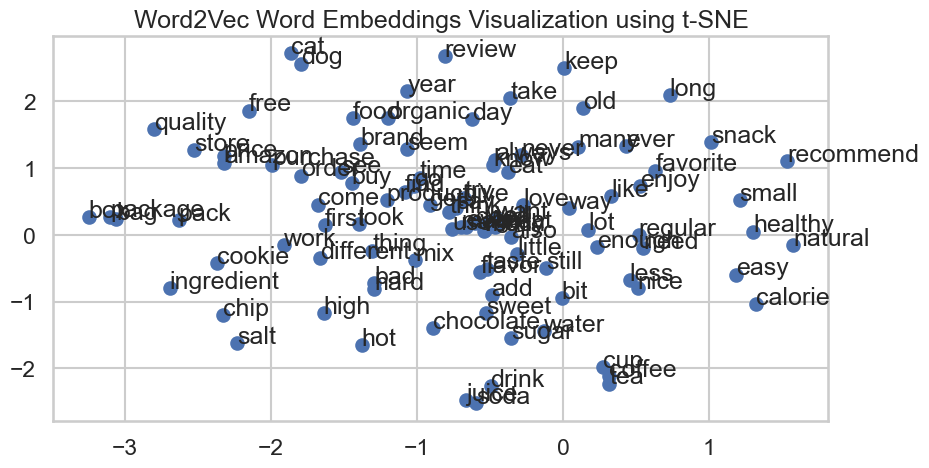

In [61]:
plt.figure(figsize=(10, 5))
plt.scatter(tsne_res[:, 0], tsne_res[:, 1])

for i, word in enumerate(words):
    plt.annotate(word, xy=(tsne_res[i, 0], tsne_res[i, 1]))

plt.title('Word2Vec Word Embeddings Visualization using t-SNE')
plt.show()

In [62]:
pca_df = pd.DataFrame(pca_scores, columns = ['x','y'])

pca_df['word'] = words
pca_df.head()

,x,y,word
0,-0.596625,1.114654,good
1,-4.779533,0.312943,taste
2,-4.064736,1.221757,flavor
3,-0.891246,1.419479,make
4,1.950123,-2.464497,product


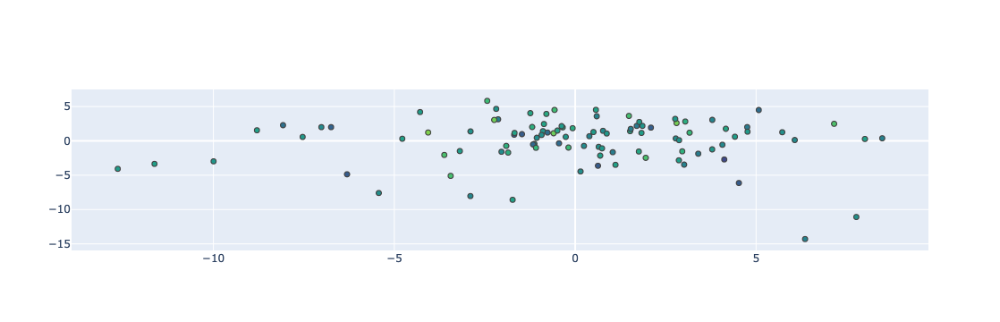

In [63]:
N = 100000

fig = go.Figure(data=go.Scattergl(
    x = pca_df['x'],
    y = pca_df['y'],
    mode='markers',
    marker=dict(
        color=np.random.randn(N),
        colorscale='Viridis',
        line_width=1
    ),
    text=pca_df['word'],
    textposition="bottom center"
))

fig.show()

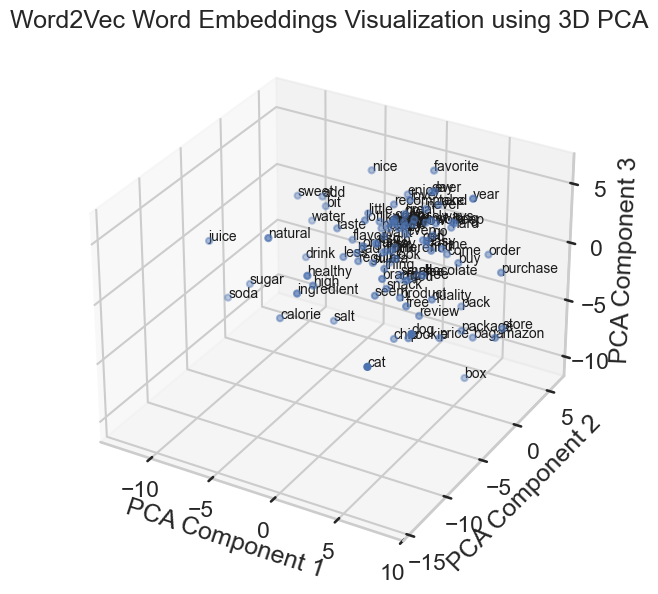

In [64]:
pca = PCA(n_components=3)
pca_scores = pca.fit_transform(word_vectors)

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(pca_scores[:, 0], pca_scores[:, 1], pca_scores[:, 2])

for i, word in enumerate(words):
    ax.text(pca_scores[i, 0], pca_scores[i, 1], pca_scores[i, 2], word, size=10, zorder=1, color='k')

ax.set_title('Word2Vec Word Embeddings Visualization using 3D PCA')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')

plt.show()

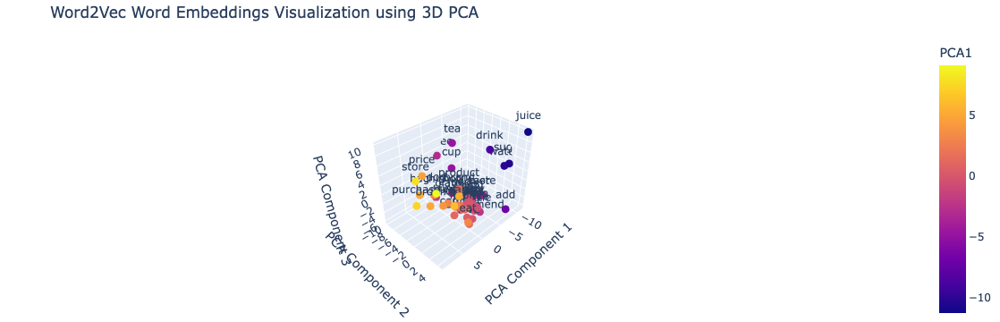

In [65]:
model = Word2Vec(sentences=corpus, vector_size=100, min_count=1, epochs=100)

word_vectors = model.wv

words = list(word_vectors.index_to_key)[:50]

word_vecs = np.array([word_vectors[word] for word in words])

pca = PCA(n_components=3)
pca_scores = pca.fit_transform(word_vecs)

import pandas as pd
df_pca = pd.DataFrame(pca_scores, columns=['PCA1', 'PCA2', 'PCA3'])
df_pca['word'] = words

fig = px.scatter_3d(df_pca, x='PCA1', y='PCA2', z='PCA3', text='word', color='PCA1',
                    title='Word2Vec Word Embeddings Visualization using 3D PCA')

fig.update_traces(marker=dict(size=5), selector=dict(mode='markers+text'))
fig.update_layout(scene=dict(xaxis_title='PCA Component 1',
                             yaxis_title='PCA Component 2',
                             zaxis_title='PCA Component 3'),
                  margin=dict(l=0, r=0, b=0, t=40))

fig.show()

In [66]:
print(df.columns)

Index(['ProfileName', 'HelpfulnessNumerator', 'HelpfulnessDenominator',
       'Score', 'Time', 'Summary', 'Text', 'raw_text', 'Corrected_text',
       'Corrected_text_without_stopwords', 'final_text', 'word_tokens'],
      dtype='object')


In [67]:
id2word = corpora.Dictionary(data_lemmatized)
texts = data_lemmatized
corpus = [id2word.doc2bow(text) for text in texts]

print(corpus[:5])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 3), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 2)], [(10, 2), (17, 1), (18, 1), (19, 1), (20, 1), (21, 2), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1)], [(31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 2), (55, 2), (56, 1), (57, 1)], [(4, 1), (6, 1), (7, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1)], [(70, 1), (71, 1), (72, 2), (73, 1), (74, 2), (75, 1), (76, 1)]]


In [68]:
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:5]]

[[('appreciate', 1),
  ('buy', 1),
  ('can', 1),
  ('dog', 1),
  ('find', 1),
  ('food', 1),
  ('good', 1),
  ('look', 1),
  ('meat', 1),
  ('process', 1),
  ('product', 3),
  ('quality', 1),
  ('several', 1),
  ('smell', 1),
  ('stew', 1),
  ('vitality', 1),
  ('well', 2)],
 [('product', 2),
  ('actually', 1),
  ('arrive', 1),
  ('error', 1),
  ('intend', 1),
  ('jumbo', 2),
  ('label', 1),
  ('peanut', 1),
  ('represent', 1),
  ('salt', 1),
  ('sized', 1),
  ('small', 1),
  ('sure', 1),
  ('unsalted', 1),
  ('vendor', 1)],
 [('brother', 1),
  ('case', 1),
  ('century', 1),
  ('chewy', 1),
  ('coat', 1),
  ('confection', 1),
  ('cut', 1),
  ('demand', 1),
  ('familiar', 1),
  ('filbert', 1),
  ('flavorful', 1),
  ('highly', 1),
  ('liberally', 1),
  ('light', 1),
  ('mouthful', 1),
  ('powdered', 1),
  ('recommend', 1),
  ('seduce', 1),
  ('sell', 1),
  ('sister', 1),
  ('square', 1),
  ('story', 1),
  ('sugar', 1),
  ('tiny', 2),
  ('treat', 2),
  ('wardrobe', 1),
  ('witch', 1)],
 [

### Unsupervised Learning 

#### Topic Modelling - LDA 

In [95]:
num_topics = 10

lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=4,
                                           alpha='auto',
                                           per_word_topics=True)

In [96]:
for idx, topic in lda_model.print_topics(-1):
    print("Topic: {} \nWords: {}".format(idx, topic ))
    print("\n")

Topic: 0 
Words: 0.053*"flavor" + 0.031*"tea" + 0.030*"love" + 0.021*"pack" + 0.021*"bag" + 0.019*"enjoy" + 0.014*"package" + 0.014*"taste" + 0.013*"perfect" + 0.012*"kid"


Topic: 1 
Words: 0.035*"good" + 0.027*"product" + 0.020*"buy" + 0.019*"great" + 0.018*"well" + 0.018*"get" + 0.016*"find" + 0.015*"really" + 0.014*"orange" + 0.013*"go"


Topic: 2 
Words: 0.051*"switch" + 0.035*"food" + 0.028*"eat" + 0.020*"healthy" + 0.019*"dog" + 0.016*"cat" + 0.016*"ingredient" + 0.014*"natural" + 0.013*"year" + 0.013*"old"


Topic: 3 
Words: 0.063*"soda" + 0.037*"make" + 0.033*"fruit" + 0.028*"add" + 0.024*"sugar" + 0.016*"ounce" + 0.016*"mix" + 0.015*"vitamin" + 0.014*"contain" + 0.013*"calorie"


Topic: 4 
Words: 0.058*"drink" + 0.050*"juice" + 0.048*"taste" + 0.030*"flavor" + 0.019*"coffee" + 0.016*"sugar" + 0.015*"carbonate" + 0.015*"water" + 0.013*"try" + 0.012*"tangerine"




In [97]:
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  

coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -7.436058584819124

Coherence Score:  0.45120170165887963


In [98]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.178548 -0.175969       1        1  35.852999
4      0.137551  0.101050       2        1  21.126140
2     -0.130818 -0.245004       3        1  15.206406
3     -0.299145  0.123386       4        1  14.855735
0      0.113865  0.196537       5        1  12.958720, topic_info=        Term         Freq        Total Category  logprob  loglift
663    drink  2778.000000  2778.000000  Default  30.0000  30.0000
69      soda  2122.000000  2122.000000  Default  29.0000  29.0000
62    flavor  3022.000000  3022.000000  Default  28.0000  28.0000
1383   juice  2430.000000  2430.000000  Default  27.0000  27.0000
946   switch  1754.000000  1754.000000  Default  26.0000  26.0000
...      ...          ...          ...      ...      ...      ...
225    sweet   348.304007   931.665423   Topic5  -4.4403   1.0595
293     like   277.363894   714.245739   Topic5  -4.6681   1.0975
159    taste   412.028387  3411.896078   Topic5  -4.2723  -0.0705
72     great   213.924982  1788.891474   Topic5  -4.9278  -0.0803
166     want   183.045929  1114.015871   Topic5  -5.0837   0.2374

[300 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
1008      5  0.997794  absolutely
2500      4  0.995689        acid
367       2  0.210132         add
367       4  0.788843         add
58        4  0.992065    addition
...     ...       ...         ...
635       5  0.995221   wonderful
731       3  0.996261       wrong
203       1  0.307404        year
203       2  0.004588        year
203       3  0.688217        year

[474 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 5, 3, 4, 1])

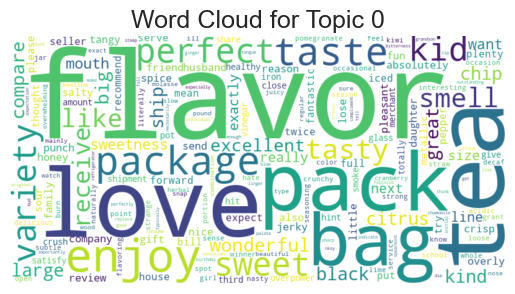

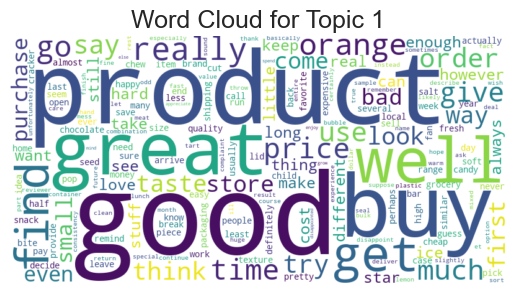

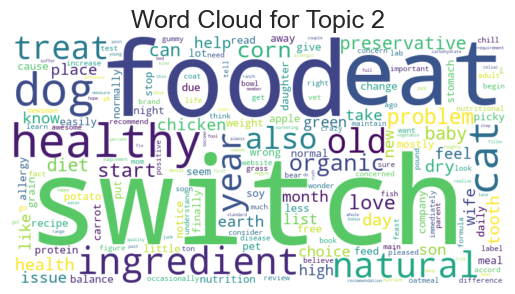

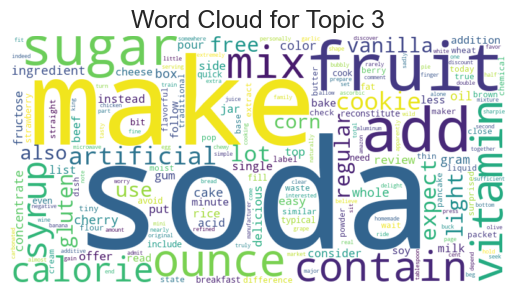

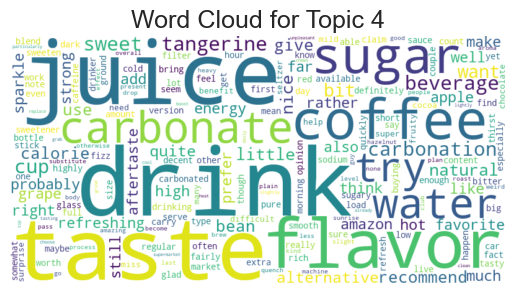

In [99]:
for i in range(lda_model.num_topics):
    plt.figure()
    wordcloud = WordCloud(background_color='white', width=800, height=400).fit_words(dict(lda_model.show_topic(i, 200)))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Word Cloud for Topic {i}")
    plt.show()

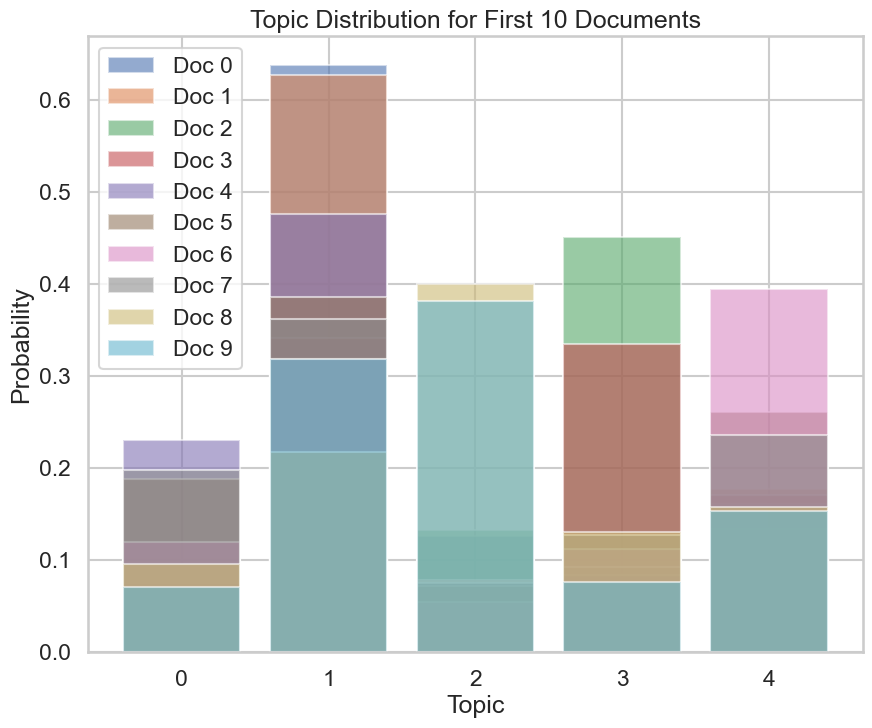

In [100]:
doc_topics = [lda_model.get_document_topics(doc) for doc in corpus]

plt.figure(figsize=(10, 8))
for i, doc in enumerate(doc_topics[:10]):
    topics = [t[0] for t in doc]
    probabilities = [t[1] for t in doc]
    plt.bar(topics, probabilities, alpha=0.6, label=f'Doc {i}')
plt.xlabel('Topic')
plt.ylabel('Probability')
plt.title('Topic Distribution for First 10 Documents')
plt.legend()
plt.show()

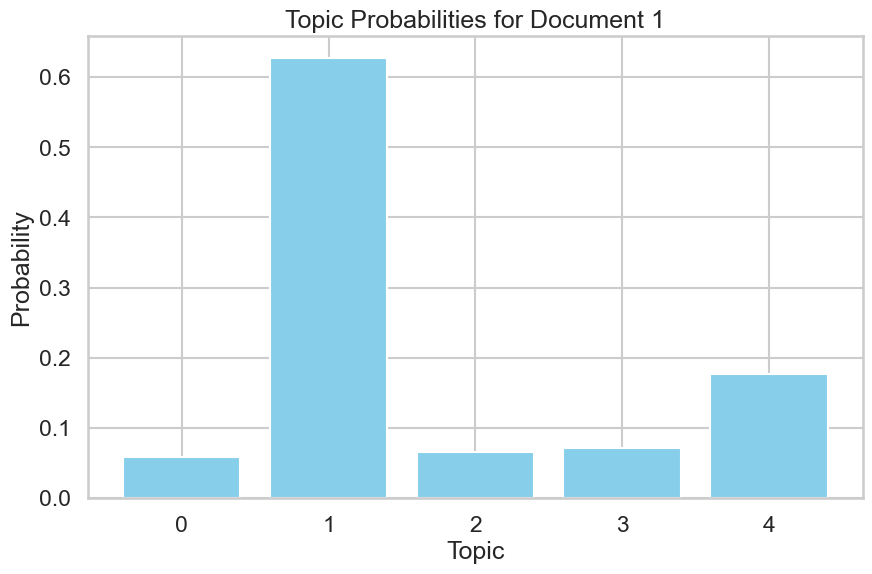

In [101]:
doc_id = 1
doc = corpus[doc_id]

topics = lda_model.get_document_topics(doc)

topic_ids, topic_probs = zip(*topics)

plt.figure(figsize=(10, 6))
plt.bar(topic_ids, topic_probs, color='skyblue')
plt.xlabel('Topic')
plt.ylabel('Probability')
plt.title(f'Topic Probabilities for Document {doc_id}')
plt.show()

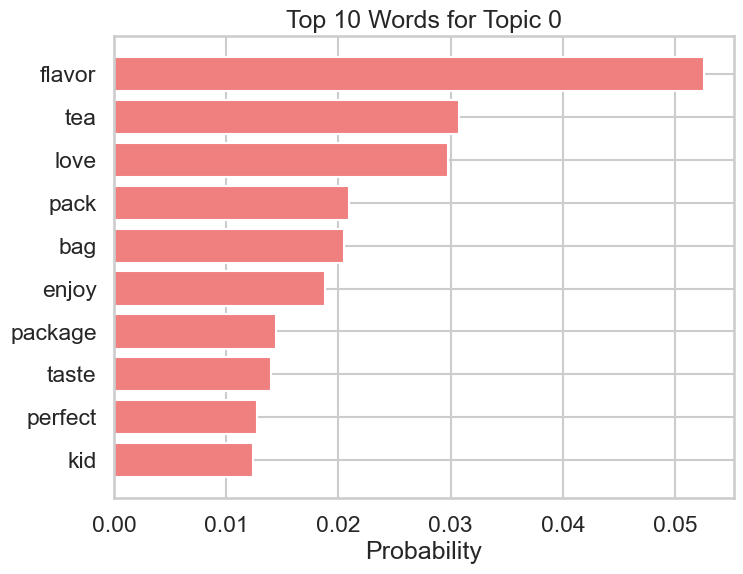

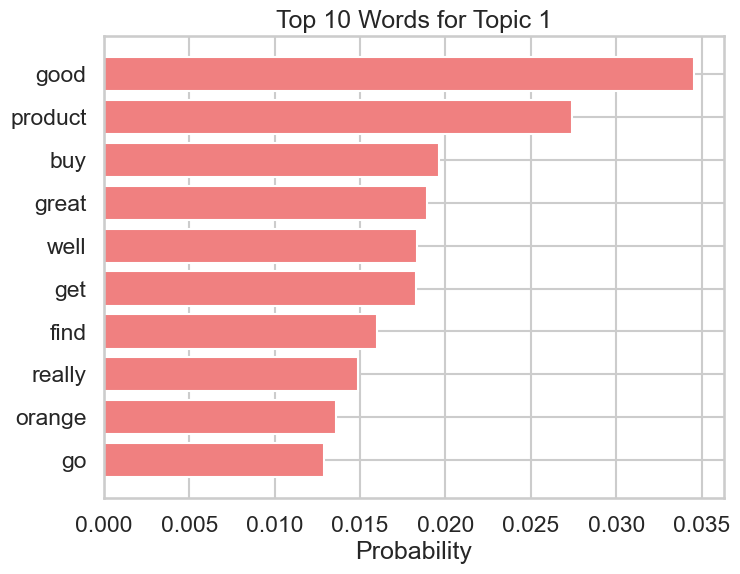

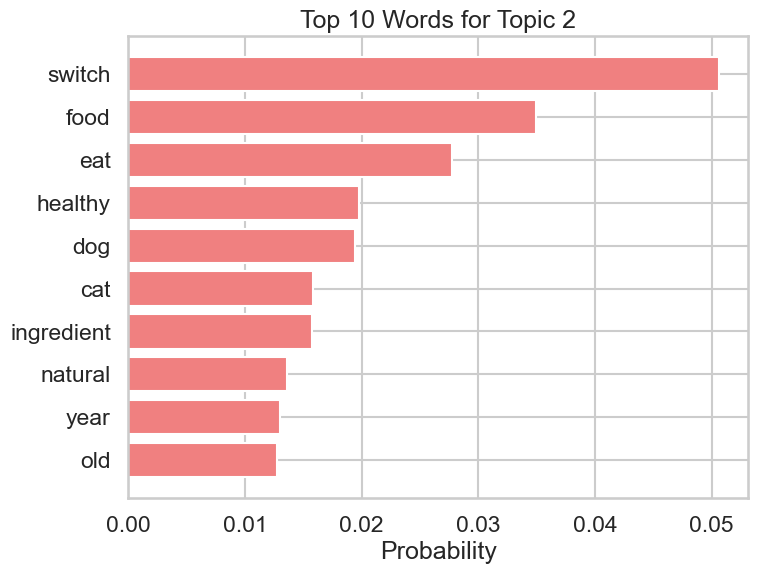

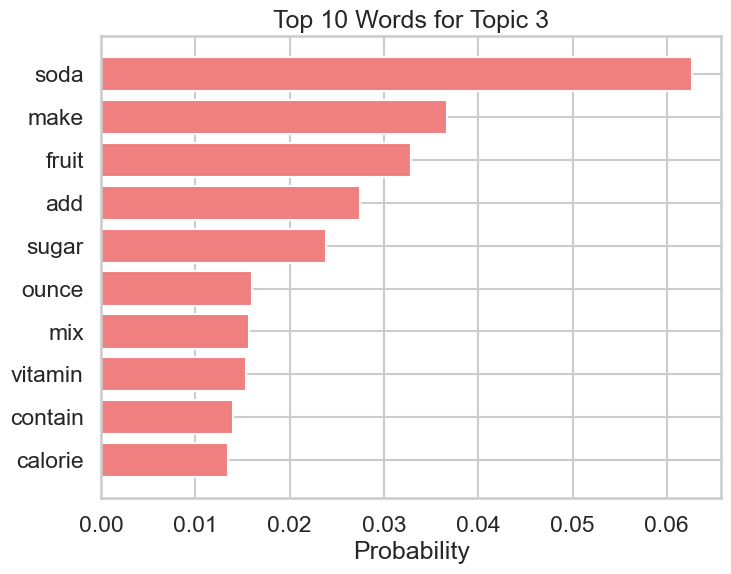

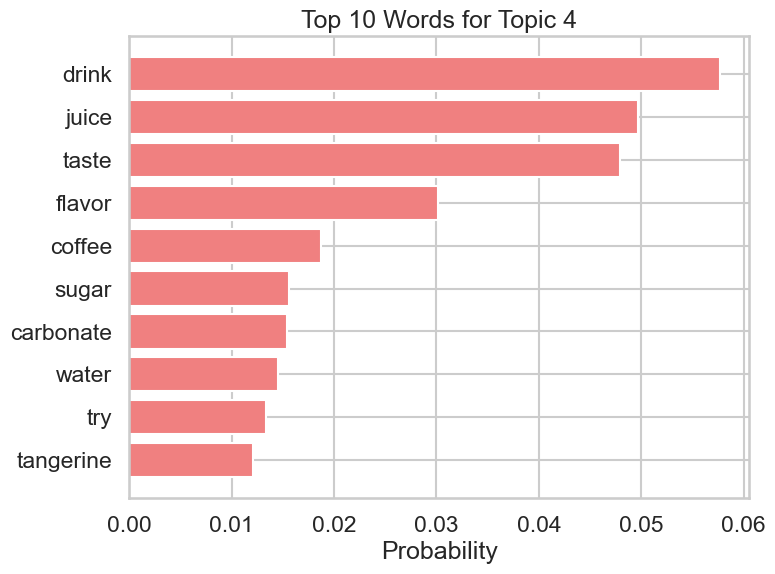

In [102]:
n_top_words = 10

for i in range(lda_model.num_topics):
    plt.figure(figsize=(8, 6))
    top_words = lda_model.show_topic(i, n_top_words)
    words, probs = zip(*top_words)
    plt.barh(words, probs, color='lightcoral')
    plt.xlabel('Probability')
    plt.title(f'Top {n_top_words} Words for Topic {i}')
    plt.gca().invert_yaxis()
    plt.show()

### Topic Modelling - Bertopic

In [103]:
rawText = df['Text']

In [104]:
bertopic_model = BERTopic(language="english", n_gram_range=(3,3), min_topic_size=140,top_n_words=10,
                          calculate_probabilities=True, verbose=True)

In [105]:
topics, probabilities = bertopic_model.fit_transform(rawText)

2024-07-16 10:13:50,352 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

2024-07-16 10:14:20,895 - BERTopic - Embedding - Completed ✓
2024-07-16 10:14:20,895 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-07-16 10:14:28,905 - BERTopic - Dimensionality - Completed ✓
2024-07-16 10:14:28,905 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-07-16 10:14:34,780 - BERTopic - Cluster - Completed ✓
2024-07-16 10:14:34,782 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-07-16 10:14:35,419 - BERTopic - Representation - Completed ✓


In [106]:
print(bertopic_model.get_topic_info())

     Topic  Count                                            Name  \
0       -1   1389                                -1_the_and_to_of   
1        0    436                        0_dog_food_dogs_dog food   
2        1    357                  1_tea_this tea_green_green tea   
3        2    350                       2_orange_juice_soda_drink   
4        3    205              3_gluten_gluten free_bisquick_free   
..     ...    ...                                             ...   
183    182      5  182_snacks_these snacks_love them_because they   
184    183      5                183_elmo_kids_old loves_one year   
185    184      5       184_chocolate_walnuts_dark chocolate_dark   
186    185      5   185_twizzlers_strawberry_sixteen ounce_of six   
187    186      5               186_the decals_decals_printed_car   

                                        Representation  \
0    [the, and, to, of, coffee, these, in, it, chip...   
1    [dog, food, dogs, dog food, he, my dog, newman... 

In [107]:
bertopic_model.get_topic(0)

[('dog', 0.017761241031883673),
 ('food', 0.013606047446865806),
 ('dogs', 0.01081507308187067),
 ('dog food', 0.009261265040486261),
 ('he', 0.00666950763288523),
 ('my dog', 0.006658743735562343),
 ('newmans', 0.0066000435840390045),
 ('her', 0.006327659431416373),
 ('she', 0.006262801248118052),
 ('my', 0.005766704831058568)]

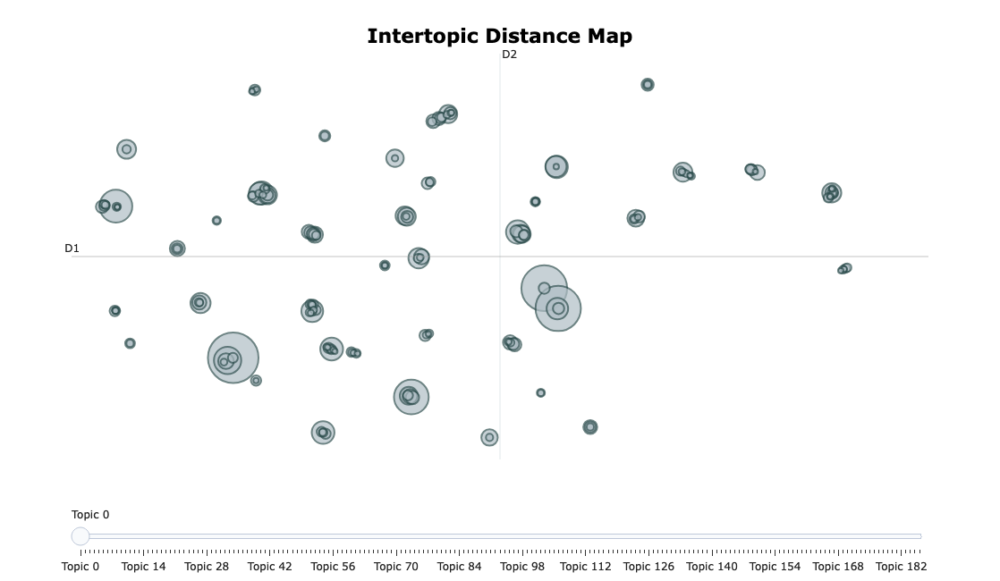

In [108]:
bertopic_model.visualize_topics()

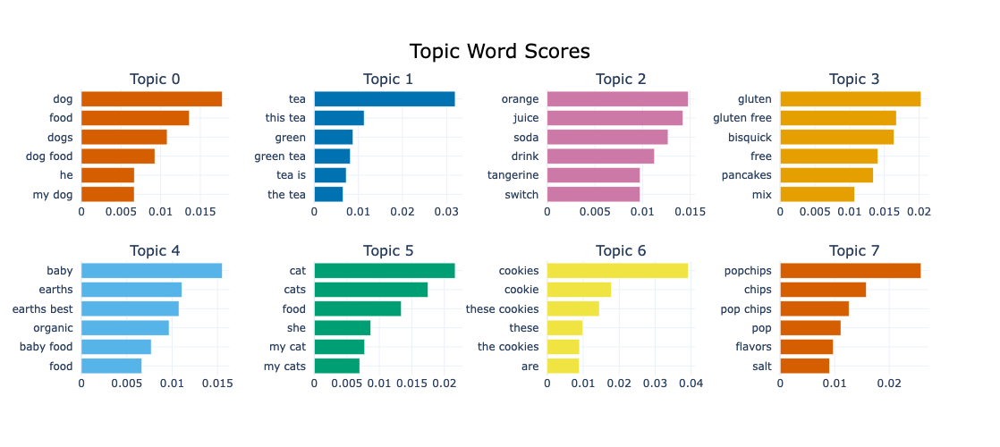

In [109]:
bertopic_model.visualize_barchart(top_n_topics=10,n_words = 10)

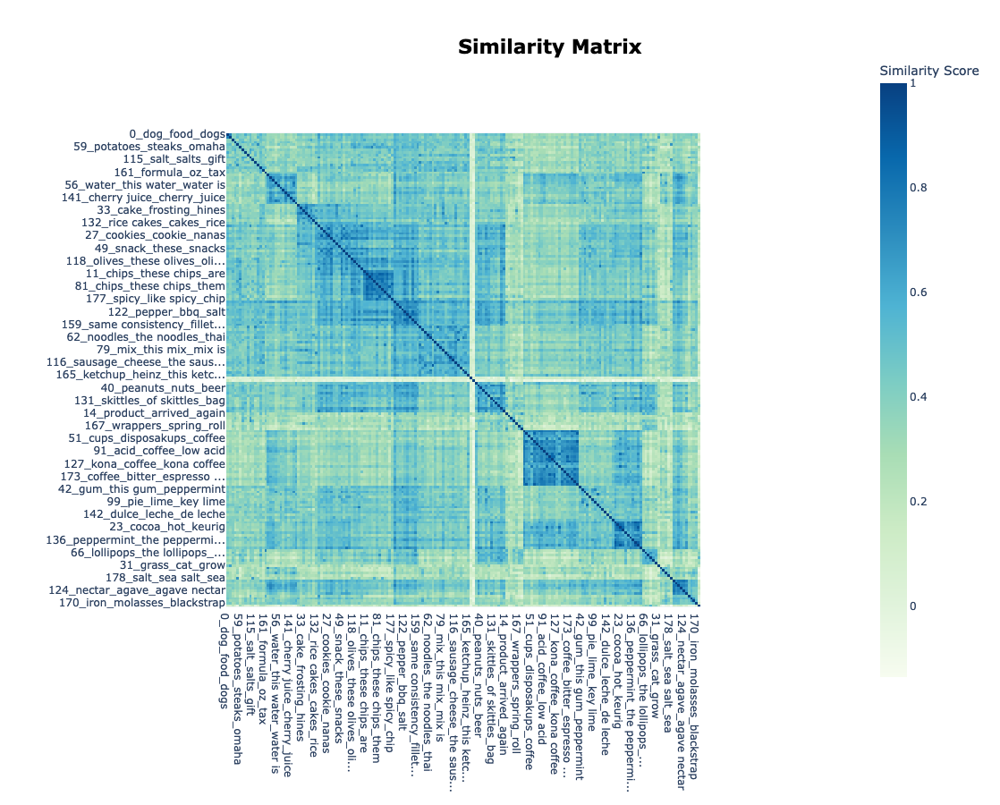

In [110]:
bertopic_model.visualize_heatmap(n_clusters=20, width=900, height=900)

In [ ]:
topic_id= 1
bertopic_model.visualize_barchart(topic=topic_id)

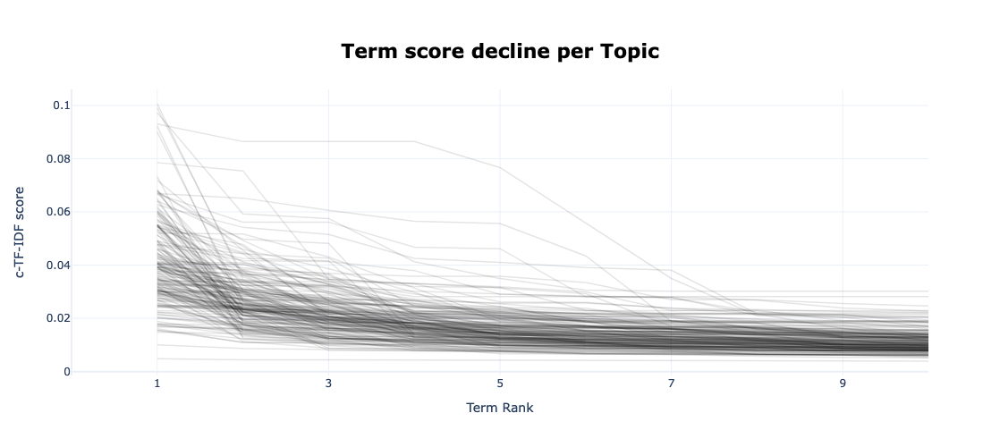

In [111]:
bertopic_model.visualize_term_rank()

In [112]:
bertopic_documents = pd.DataFrame({"Document": rawText.values, "Topic": topics})
bertopic_documents_per_topic = bertopic_documents.groupby(['Topic'], as_index=False)['Document'].agg(' '.join)
bertopic_cleaned_docs = bertopic_model._preprocess_text(bertopic_documents_per_topic['Document'].values)

bertopic_tokens = [bertopic_model.vectorizer_model.build_analyzer()(doc) for doc in bertopic_cleaned_docs]
bertopic_dictionary = corpora.Dictionary(bertopic_tokens)
bertopic_corpus = [bertopic_dictionary.doc2bow(token) for token in bertopic_tokens]

bertopic_coherence_model = CoherenceModel(topics=bertopic_tokens,
                                         texts=bertopic_tokens,
                                         corpus=bertopic_corpus,
                                         dictionary=bertopic_dictionary,
                                         coherence='c_v')
bertopic_coherence = bertopic_coherence_model.get_coherence()

print(f"Bertopic Coherence Score: {bertopic_coherence}")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Bertopic Coherence Score: 0.7129543060366694


##### Bertopic shows better coherence score (0.71) than LDA (0.45)after adding n-grams.

### Supervised Learning - Sentiment Analysis

In [96]:
X = df["final_text"]
Y = df["Score"]

In [97]:
le = LabelEncoder()
Y = le.fit_transform(Y)

In [98]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.30,
                                                    stratify=Y, random_state=42)

print('Shape of x_train and y_train: ', X_train.shape, y_train.shape)
print('Shape of x_test and y_test: ',   X_test.shape,  y_test.shape)

Shape of x_train and y_train:  (4891,) (4891,)
Shape of x_test and y_test:  (2097,) (2097,)


In [99]:
vect.fit(X_train)
X_train = vect.transform(X_train)
X_test  = vect.transform(X_test)

In [117]:
LRmodel = LogisticRegression(C = 2, max_iter = 1000, n_jobs=-1)
LRmodel.fit(X_train, y_train)
y_pred = LRmodel.predict(X_test)
print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
print(cm)

              precision    recall  f1-score   support

           0       0.63      0.32      0.42       192
           1       0.37      0.06      0.10       126
           2       0.28      0.14      0.18       182
           3       0.39      0.16      0.23       299
           4       0.70      0.95      0.81      1298

    accuracy                           0.66      2097
   macro avg       0.47      0.33      0.35      2097
weighted avg       0.59      0.66      0.59      2097

[[  61    4    8    7  112]
 [  15    7   21   11   72]
 [   9    3   25   27  118]
 [   1    1   20   49  228]
 [  11    4   16   32 1235]]


In [118]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

rf_model.fit(X_train, y_train)

y_pred_rf = rf_model.predict(X_test)

print("Random Forest Model:")
print(classification_report(y_test, y_pred_rf))
print(confusion_matrix(y_test, y_pred_rf))

Random Forest Model:
              precision    recall  f1-score   support

           0       0.67      0.14      0.23       192
           1       1.00      0.02      0.05       126
           2       0.17      0.02      0.03       182
           3       0.42      0.02      0.03       299
           4       0.63      0.99      0.77      1298

    accuracy                           0.63      2097
   macro avg       0.58      0.24      0.22      2097
weighted avg       0.59      0.63      0.51      2097

[[  26    0    1    0  165]
 [   3    3    2    2  116]
 [   2    0    3    2  175]
 [   3    0    7    5  284]
 [   5    0    5    3 1285]]


In [119]:
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)

gb_model.fit(X_train, y_train)

y_pred_gb = gb_model.predict(X_test)

print("Gradient Boosting Model:")
print(classification_report(y_test, y_pred_gb))
print(confusion_matrix(y_test, y_pred_gb))

Gradient Boosting Model:
              precision    recall  f1-score   support

           0       0.69      0.19      0.30       192
           1       0.40      0.05      0.09       126
           2       0.26      0.07      0.10       182
           3       0.32      0.07      0.12       299
           4       0.66      0.97      0.79      1298

    accuracy                           0.64      2097
   macro avg       0.46      0.27      0.28      2097
weighted avg       0.56      0.64      0.55      2097

[[  37    3    1    7  144]
 [   3    6    7    8  102]
 [   5    1   12   19  145]
 [   2    1   14   22  260]
 [   7    4   13   13 1261]]


In [120]:
svm_model = SVC(kernel='linear', C=1.0)

svm_model.fit(X_train, y_train)

y_pred_svm = svm_model.predict(X_test)

print("Support Vector Machine (SVM) Model:")
print(classification_report(y_test, y_pred_svm))
print(confusion_matrix(y_test, y_pred_svm))

Support Vector Machine (SVM) Model:
              precision    recall  f1-score   support

           0       0.60      0.33      0.43       192
           1       0.38      0.04      0.07       126
           2       0.26      0.12      0.16       182
           3       0.41      0.09      0.14       299
           4       0.68      0.96      0.80      1298

    accuracy                           0.65      2097
   macro avg       0.47      0.31      0.32      2097
weighted avg       0.58      0.65      0.57      2097

[[  64    2    7    4  115]
 [  16    5   19    4   82]
 [  10    1   21   15  135]
 [   2    3   16   26  252]
 [  14    2   19   15 1248]]


In [102]:
X_train, X_test, y_train, y_test = train_test_split(df["final_text"], Y, test_size=0.30, stratify=Y, random_state=42)

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

def tokenize_texts(texts, tokenizer, max_len=128):
    return tokenizer(
        texts.tolist(),
        max_length=max_len,
        padding='max_length',
        truncation=True,
        return_tensors='tf'
    )

X_train_tokens = tokenize_texts(X_train, tokenizer)
X_test_tokens = tokenize_texts(X_test, tokenizer)

num_labels = len(le.classes_)

model = TFBertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=num_labels)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=2e-5),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

history = model.fit(
    X_train_tokens.data,
    y_train,
    epochs=2,
    batch_size=32,
    validation_data=(X_test_tokens.data, y_test)
)

loss, accuracy = model.evaluate(X_test_tokens.data, y_test)
print(f"Test Accuracy: {accuracy}")

y_pred_logits = model.predict(X_test_tokens.data)
y_pred = tf.argmax(y_pred_logits.logits, axis=1).numpy()
print("Example predictions:", y_pred[:10])

2024-07-20 15:12:55,272 : WARNING : From C:\Users\user\anaconda3\Lib\site-packages\keras\src\backend.py:873: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

All PyTorch model weights were used when initializing TFBertForSequenceClassification.

Some weights or buffers of the TF 2.0 model TFBertForSequenceClassification were not initialized from the PyTorch model and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/2



2024-07-20 15:13:25,016 : WARNING : From C:\Users\user\anaconda3\Lib\site-packages\keras\src\utils\tf_utils.py:492: The name tf.ragged.RaggedTensorValue is deprecated. Please use tf.compat.v1.ragged.RaggedTensorValue instead.



2024-07-20 15:13:46,737 : WARNING : From C:\Users\user\anaconda3\Lib\site-packages\keras\src\engine\base_layer_utils.py:384: The name tf.executing_eagerly_outside_functions is deprecated. Please use tf.compat.v1.executing_eagerly_outside_functions instead.



153/153 [==============================] - 11569s 75s/step - loss: 1.1164 - accuracy: 0.6144 - val_loss: 0.9730 - val_accuracy: 0.6557
Epoch 2/2
66/66 [==============================] - 196s 3s/step - loss: 0.9139 - accuracy: 0.6571
Test Accuracy: 0.6571292281150818
66/66 [==============================] - 200s 3s/step
Example predictions: [4 4 4 2 4 4 4 4 4 0]


In [123]:
param_dist = {
    'C': uniform(loc=0.1, scale=10.0),
    'solver': ['liblinear', 'lbfgs', 'saga'],
    'penalty': ['l1', 'l2']  
}

random_search = RandomizedSearchCV(estimator=LRmodel, param_distributions=param_dist, n_iter=20, cv=5, verbose=1, n_jobs=-1, random_state=42)

random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)

best_LRmodel = random_search.best_estimator_

best_LRmodel.fit(X_train, y_train)

y_pred = best_LRmodel.predict(X_test)

print("Logistic Regression Model:")
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. 

Best Parameters: {'C': 2.2233911067827616, 'penalty': 'l2', 'solver': 'liblinear'}
Logistic Regression Model:
              precision    recall  f1-score   support

           0       0.65      0.29      0.40       192
           1       0.31      0.03      0.06       126
           2       0.23      0.09      0.13       182
           3       0.39      0.12      0.19       299
           4       0.68      0.96      0.80      1298

    accuracy                           0.65      2097
   macro avg       0.45      0.30      0.32      2097
weighted avg       0.58      0.65      0.57      2097

[[  56    3    6    4  123]
 [  15    4   20    8   79]
 [   5    3   17   26  131]
 [   1    0   18   37  243]
 [   9    3   14   21 1251]]


<Axes: >

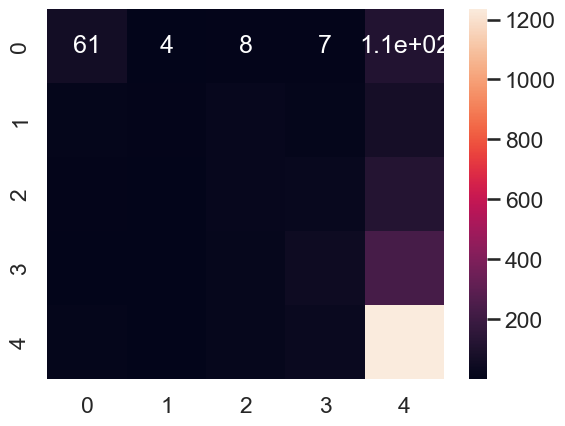

In [124]:
sns.heatmap(cm, annot=True)

<Axes: >

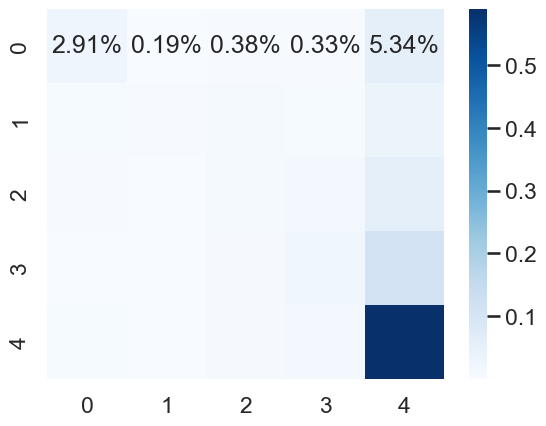

In [125]:
sns.heatmap(cm/np.sum(cm), annot=True,
            fmt='.2%', cmap='Blues')

In [126]:
X_lime = df["raw_text"]
Y_lime = df["Score"]

X_train_lime, X_test_lime, y_train_lime, y_test_lime = train_test_split(X_lime, Y_lime, test_size=0.30,
                                                        stratify=Y_lime, random_state=42)
c = make_pipeline(CountVectorizer(), LRmodel)
c.fit(X_train_lime, y_train_lime)

explainer = LimeTextExplainer(class_names=['1', '2', '3', '4', '5'])

idx = 500

print(df['raw_text'].iloc[idx])

if idx < len(df):
    text_instance = df.iloc[idx, :]['raw_text']
    exp = explainer.explain_instance(text_instance, c.predict_proba, num_features=3)
    exp.show_in_notebook(text=False)
else:
    print(f"Index {idx} is out of bounds for the DataFrame.")

It was a great value and I like the package size but not vinegary enough for me. Won't order this brand again. Great chips otherwise.


### Machine Translation

In [16]:
model_name = 'Helsinki-NLP/opus-mt-en-de'
tokenizer = MarianTokenizer.from_pretrained(model_name)
model = MarianMTModel.from_pretrained(model_name)

def translate(texts):
    batch_size = 8
    translated_texts = []

    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]
        inputs = tokenizer(batch, return_tensors="pt", padding=True, truncation=True)
        outputs = model.generate(**inputs)
        translated_batch = [tokenizer.decode(output, skip_special_tokens=True) for output in outputs]
        translated_texts.extend(translated_batch)

    return translated_texts

df['translated_text'] = translate(df['raw_text'].tolist())

df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text,translated_text
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,I have bought several of the Vitality canned d...,Ich habe einige der Vitality Dosen Hundefutter...
1,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,Product arrived labeled as Jumbo Salted Peanut...,Das Produkt kam als Jumbo gesalzene Erdnüsse.....
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,This is a confection that has been around a fe...,"Es ist eine leichte, kissenförmige Zitrusgelat..."
3,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...,Wenn Sie nach der geheimen Zutat in Robitussin...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,Great taffy at a great price. There was a wid...,Große Taffy zu einem tollen Preis. Es gab ein ...


In [17]:
model_name = 't5-base'
tokenizer = T5Tokenizer.from_pretrained(model_name)
model = T5ForConditionalGeneration.from_pretrained(model_name)


def translate_t5(texts, target_language="German"):
    batch_size = 8
    translated_texts = []

    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]
        input_texts = [f"translate English to {target_language}: {text}" for text in batch]
        inputs = tokenizer(input_texts, return_tensors="pt", padding=True, truncation=True)
        outputs = model.generate(**inputs)
        translated_batch = [tokenizer.decode(output, skip_special_tokens=True) for output in outputs]
        translated_texts.extend(translated_batch)

    return translated_texts

df['translated_text_t5'] = translate_t5(df['raw_text'].tolist())

df.head()

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text,translated_text,translated_text_t5
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,I have bought several of the Vitality canned d...,Ich habe einige der Vitality Dosen Hundefutter...,Ich habe mehrere Vitality-Konserven-Hundenahru...
1,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,Product arrived labeled as Jumbo Salted Peanut...,Das Produkt kam als Jumbo gesalzene Erdnüsse.....,The room was very small and the bathroom was v...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,This is a confection that has been around a fe...,"Es ist eine leichte, kissenförmige Zitrusgelat...",Dieses Süßspeise ist ein jahrhundertealtes Pro...
3,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...,Wenn Sie nach der geheimen Zutat in Robitussin...,Ich habe dieses Produkt zusätzlich zum Root Be...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,Great taffy at a great price. There was a wid...,Große Taffy zu einem tollen Preis. Es gab ein ...,"Die freundliche und hilfsbereite Mitarbeiter, ..."


In [22]:
def translate_google(texts, target_language="de", max_retries=5):
    translator = Translator()
    translated_texts = []

    for text in texts:
        for attempt in range(max_retries):
            try:
                translated = translator.translate(text, dest=target_language).text
                if translated is not None:
                    translated_texts.append(translated)
                    break
                else:
                    raise ValueError("Received NoneType result")
            except Exception as e:
                print(f"Error translating '{text}' (attempt {attempt + 1}): {e}")
                time.sleep(1)
                if attempt == max_retries - 1:
                    translated_texts.append(text)

    return translated_texts

texts_to_translate = df['raw_text'].iloc[:5].tolist()

translated_texts = translate_google(texts_to_translate, target_language="de")

df.loc[:4, 'google_translate'] = translated_texts

df.head()

,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,raw_text,translated_text,translated_text_t5,google_translate
0,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,I have bought several of the Vitality canned d...,Ich habe einige der Vitality Dosen Hundefutter...,Ich habe mehrere Vitality-Konserven-Hundenahru...,Ich habe einige der Vitalitätsnahrungsmittel i...
1,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,Product arrived labeled as Jumbo Salted Peanut...,Das Produkt kam als Jumbo gesalzene Erdnüsse.....,The room was very small and the bathroom was v...,Produkt angekommen als als Jumbo gesalzene Erd...
2,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,This is a confection that has been around a fe...,"Es ist eine leichte, kissenförmige Zitrusgelat...",Dieses Süßspeise ist ein jahrhundertealtes Pro...,"Dies ist ein Konfekt, das es einige Jahrhunder..."
3,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,If you are looking for the secret ingredient i...,Wenn Sie nach der geheimen Zutat in Robitussin...,Ich habe dieses Produkt zusätzlich zum Root Be...,Wenn Sie nach der geheimen Zutat in Robitussin...
4,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,Great taffy at a great price. There was a wid...,Große Taffy zu einem tollen Preis. Es gab ein ...,"Die freundliche und hilfsbereite Mitarbeiter, ...",Toller Taffy zu einem tollen Preis.Es gab eine...
